* このノートブックで使うライブラリの読み込み

In [1]:
%matplotlib inline
import seaborn
import numpy as np
import scipy
import scipy.signal
import scipy.io.wavfile
import matplotlib.pyplot as plt
#import pandas
#import librosa, librosa.display

* ノートブックで使う関数定義

In [2]:
import sys
sys.path.append('../SLAM-Robot_Simu')
from mylib2 import Signal

* `scipy`の`io.wavfile.read`が24-bitに対応していないので、あらかじめ16-bitにダウンサンプルしておく (`-b 16`)
* ついでに1-channelだけ抜き出す (`remix 1`)
    * ```sox forehand.WAV -b 16 forehand16.WAV remix 1```

In [3]:
fs, x = scipy.io.wavfile.read("forehand16.WAV")

* 試しに再生する

In [4]:
from IPython.display import Audio
Audio(x,rate=fs)

* 一回分を切り出す (試行錯誤)

In [5]:
# start time, duration (seconds)
(t,i)=(21.4,0.7)
s=x[int(t*fs):int((t+i)*fs)]

In [6]:
Audio(s,rate=fs)

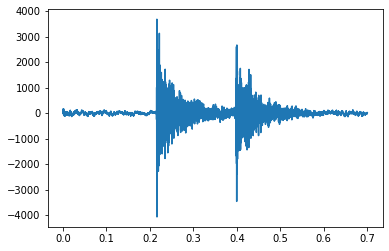

In [7]:
plt.plot(np.linspace(0,i,s.size),s)

In [8]:
lpc = Signal.LPC(fs=fs)

In [322]:
lpc.fs = fs
lpc.lpcOrder = 16
lpc.nfft = 512

In [323]:
# start time, duration (seconds)
#(t,i)=(21.4+0.12, 0.22) # table impact
(t,i)=(21.4+0.35, 0.1) # racket impact
s=x[int(t*fs):int((t+i)*fs)]

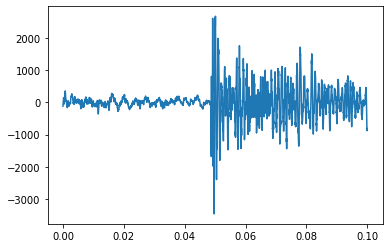

In [324]:
plt.plot(np.linspace(0,i,s.size),s)

In [325]:
s = lpc.preEmphasis(s, 0.97)
hammingWindow = np.hamming(len(s))
s = s * hammingWindow
freqs,bw=lpc.process(s)

In [326]:
freqs,bw

(array([ 1373.83094627,  4114.60783863,  7371.13482926,  9781.51957748,
        12244.40767443, 15104.00789931, 18302.98592768, 20685.48254926]),
 array([ 348.42051308,  441.30241778,  573.48957435,  344.81798609,
         257.38015498, 1248.29014642, 1560.45085329,  586.28422253]))

In [331]:
t1=19
#x=[]
y=[]
z=[]
sy=[]
cy=[]

while t1<23:
    s = x[int(t1*fs):int((t1+0.01)*fs)]
    s = lpc.preEmphasis(s, 0.97)
    hammingWindow = np.hamming(len(s))
    s = s * hammingWindow
    freqs,bw=lpc.process(s)
    
    thr = 500.
    for a in np.where((bw<thr) & (freqs>0.)&(freqs < fs/2.))[0]:
        y.append(t1)
        z.append(freqs[a])
        sy.append(1/bw[a]*40000)
        cy.append(bw[a])
        
    t1 += 0.025

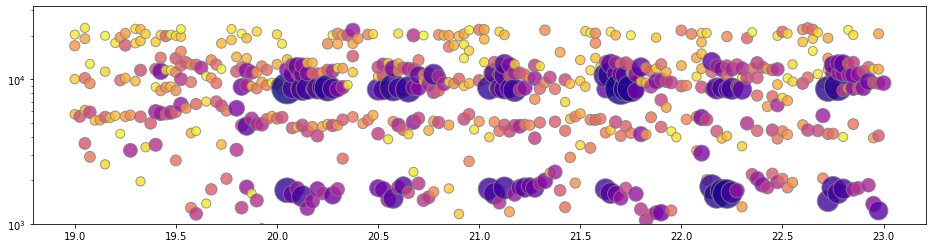

In [345]:
cmap = plt.get_cmap('plasma')
plt.figure(figsize=(16,4))
plt.yscale('log')
plt.ylim((1000,32000))
plt.scatter(y,z,s=sy,alpha=0.8, c=cy, cmap=cmap, edgecolor='gray')

Text(0, 0.5, 'Frequency')

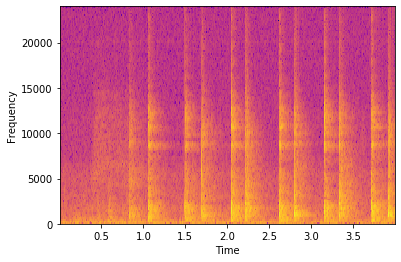

In [279]:
(t,i)=(19,4)
s=x[int(t*fs):int((t+i)*fs)]

hammingWindow = np.hamming(256)
S, freqs, bins, im = plt.specgram(s, NFFT=256, Fs=fs, noverlap=128, window=hammingWindow, mode='psd', scale='dB', cmap='plasma')

# Plot a spectrogram
plt.xlabel('Time')
plt.ylabel('Frequency')

In [346]:
fs, x = scipy.io.wavfile.read("smash_edited16.wav")

* 試しに再生する

In [348]:
from IPython.display import Audio
Audio(x,rate=fs)

* 一回分を切り出す (試行錯誤)

In [361]:
# start time, duration (seconds)
(t,i)=(2.0,2.5)
s=x[int(t*fs):int((t+i)*fs)]

In [362]:
Audio(s,rate=fs)

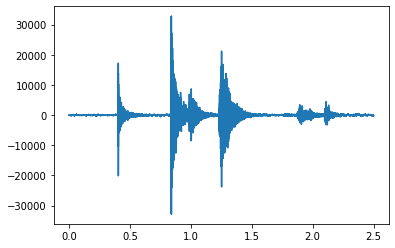

In [363]:
plt.plot(np.linspace(0,i,s.size),s)

In [364]:
lpc = Signal.LPC(fs=fs)

In [365]:
lpc.fs = fs
lpc.lpcOrder = 16
lpc.nfft = 512

In [403]:
# start time, duration (seconds)
#(t,i)=(2.2+0.105, 0.2) # table impact
(t,i)=(3.15, 0.2) # racket impact
s=x[int(t*fs):int((t+i)*fs)]

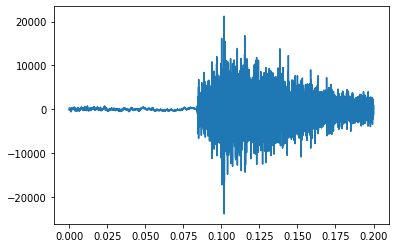

In [404]:
plt.plot(np.linspace(0,i,s.size),s)

In [405]:
s = lpc.preEmphasis(s, 0.97)
hammingWindow = np.hamming(len(s))
s = s * hammingWindow
freqs,bw=lpc.process(s)

In [406]:
freqs,bw

(array([ 3107.11299055,  5580.81890727,  8452.95756208, 10019.73016735,
        12264.67754903, 14955.98839491, 18502.33127079, 21906.31266616]),
 array([ 340.20542305,  465.21024154,  359.75672066,  569.59149882,
         449.57751941,  509.09452881,  598.29210788, 1037.83504774]))

In [382]:
t1=2
#x=[]
y=[]
z=[]
sy=[]
cy=[]

while t1<5:
    s = x[int(t1*fs):int((t1+0.01)*fs)]
    s = lpc.preEmphasis(s, 0.97)
    hammingWindow = np.hamming(len(s))
    s = s * hammingWindow
    freqs,bw=lpc.process(s)
    
    thr = 500.
    for a in np.where((bw<thr) & (freqs>0.)&(freqs < fs/2.))[0]:
        y.append(t1)
        z.append(freqs[a])
        sy.append(1/bw[a]*40000)
        cy.append(bw[a])
        
    t1 += 0.025

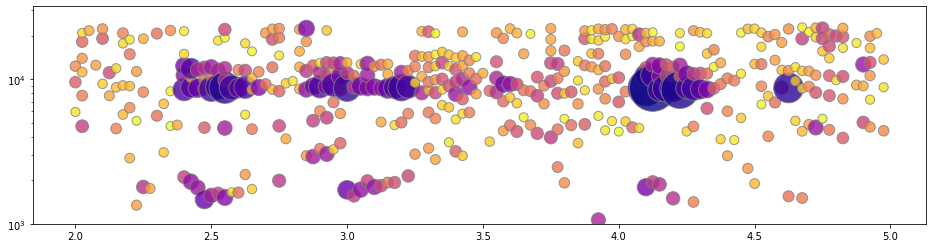

In [383]:
cmap = plt.get_cmap('plasma')
plt.figure(figsize=(16,4))
plt.yscale('log')
plt.ylim((1000,32000))
plt.scatter(y,z,s=sy,alpha=0.8, c=cy, cmap=cmap, edgecolor='gray')

Text(0, 0.5, 'Frequency')

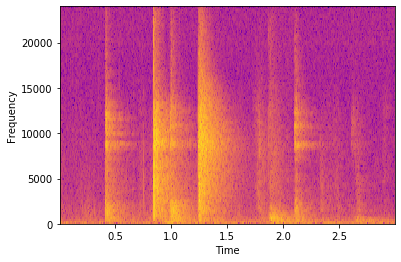

In [384]:
(t,i)=(2,3)
s=x[int(t*fs):int((t+i)*fs)]

hammingWindow = np.hamming(256)
S, freqs, bins, im = plt.specgram(s, NFFT=256, Fs=fs, noverlap=128, window=hammingWindow, mode='psd', scale='dB', cmap='plasma')

# Plot a spectrogram
plt.xlabel('Time')
plt.ylabel('Frequency')